In [40]:
using CSV
using DataFrames
using Statistics
using ScikitLearn
using ScikitLearn.Pipelines: Pipeline
using ScikitLearn.CrossValidation: train_test_split
@sk_import feature_selection: (SelectKBest, f_classif)
@sk_import preprocessing: (MinMaxScaler, LabelEncoder)
@sk_import decomposition: (PCA, FastICA)
@sk_import discriminant_analysis: LinearDiscriminantAnalysis
@sk_import manifold: (Isomap, LocallyLinearEmbedding)
@sk_import linear_model: LogisticRegression
using RDatasets
using Random
using StatsBase 
using CategoricalArrays


# Ruta al archivo CSV
file_path = "Datos_Práctica_Evaluación_1.csv"

# Cargar los datos
data = CSV.read(file_path, DataFrame)

# Descripción de los datos
println("Descripción de los datos:")
println("Número de variables (columnas): ", size(data, 2)-2)
println("Número de instancias (filas): ", size(data, 1))
println("Número de individuos únicos: ", length(unique(data.subject)))
println("Número de clases de salida: ", length(unique(data.Activity)))
missing_percentage_per_column = map(col -> mean(ismissing, col) * 100, eachcol(data))
println("Porcentaje de nulos por variable:", missing_percentage_per_column)
println("Media de todos los porcentajes de nulo: ",sum(missing_percentage_per_column) / length(missing_percentage_per_column))


Descripción de los datos:
Número de variables (columnas): 561
Número de instancias (filas): 10299
Número de individuos únicos: 30
Número de clases de salida: 

6
Porcentaje de nulos por variable:[0.0, 0.0, 0.0, 0.0, 0.01941936110301971, 0.0, 0.01941936110301971, 0.01941936110301971, 0.029129041654529564, 0.029129041654529564, 0.01941936110301971, 0.0, 0.009709680551509855, 0.0, 0.0, 0.0, 0.009709680551509855, 0.0, 0.0, 0.0, 0.029129041654529564, 0.009709680551509855, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.009709680551509855, 0.0, 0.0, 0.03883872220603942, 0.03883872220603942, 0.01941936110301971, 0.009709680551509855, 0.0, 0.0, 0.0, 0.0, 0.0, 0.029129041654529564, 0.009709680551509855, 0.009709680551509855, 0.0, 0.0, 0.029129041654529564, 0.01941936110301971, 0.01941936110301971, 0.009709680551509855, 0.009709680551509855, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

In [41]:
for col in names(data)
    if eltype(data[!, col]) <: Union{Missing, Real}
        col_mean = mean(skipmissing(data[!, col]))
        data[!, col] = coalesce.(data[!, col], col_mean)
    end
end
missing_percentage_per_column = map(col -> mean(ismissing, col) * 100, eachcol(data))

println("Media de todos los porcentajes de nulo: ",sum(missing_percentage_per_column) / length(missing_percentage_per_column))

Media de todos los porcentajes de nulo: 0.0


In [42]:

# 3. Codificar variables categóricas
categorical_cols = filter(col -> eltype(data[!, col]) <: AbstractString, names(data))
println("Variables categóricas detectadas: ", categorical_cols)
for col in categorical_cols
    data[!, col] = categorical(data[!, col])  # Convertir a tipo categórico
end

# 4. Escalar variables numéricas
numerical_cols = filter(col -> eltype(data[!, col]) <: Number, names(data))
for col in numerical_cols
    col_values = data[!, col]
    data[!, col] = (col_values .- mean(col_values)) ./ std(col_values)  # Z-score
end

println("Transformación de datos completada.")

# 5. Verificar los datos transformados
println("Primeras filas de los datos:")
println(first(data, 5))


Variables categóricas detectadas: ["Activity"]
Transformación de datos completada.
Primeras filas de los datos:
5×563 DataFrame
 Row │ subject   tBodyAcc-mean()-X  tBodyAcc-mean()-Y  tBodyAcc-mean()-Z  tBodyAcc-std()-X  tBodyAcc-std()-Y  tBodyAcc-std()-Z  tBodyAcc-mad()-X  tBodyAcc-mad()-Y  tBodyAcc-mad()-Z  tBodyAcc-max()-X  tBodyAcc-max()-Y  tBodyAcc-max()-Z  tBodyAcc-min()-X  tBodyAcc-min()-Y  tBodyAcc-min()-Z  tBodyAcc-sma()  tBodyAcc-energy()-X  tBodyAcc-energy()-Y  tBodyAcc-energy()-Z  tBodyAcc-iqr()-X  tBodyAcc-iqr()-Y  tBodyAcc-iqr()-Z  tBodyAcc-entropy()-X  tBodyAcc-entropy()-Y  tBodyAcc-entropy()-Z  tBodyAcc-arCoeff()-X,1  tBodyAcc-arCoeff()-X,2  tBodyAcc-arCoeff()-X,3  tBodyAcc-arCoeff()-X,4  tBodyAcc-arCoeff()-Y,1  tBodyAcc-arCoeff()-Y,2  tBodyAcc-arCoeff()-Y,3  tBodyAcc-arCoeff()-Y,4  tBodyAcc-arCoeff()-Z,1  tBodyAcc-arCoeff()-Z,2  tBodyAcc-arCoeff()-Z,3  tBodyAcc-arCoeff()-Z,4  tBodyAcc-correlation()-X,Y  tBodyAcc-correlation()-X,Z  tBodyAcc-correlation()-Y,Z  tGravityAcc

In [43]:

# Semilla para reproducibilidad
seed = 172
Random.seed!(seed)

# Supongamos que los datos están cargados en un DataFrame llamado `data`
# Y que la columna `subject` identifica a cada individuo.

# Obtener la lista única de individuos
individuos = unique(data.subject)

# Seleccionar el 10% de los individuos al azar
num_holdout = ceil(Int, length(individuos) * 0.1)  # Redondeo hacia arriba para asegurar al menos 1
holdout_individuos = StatsBase.sample(individuos, num_holdout, replace=false)
# Dividir los datos en train y holdout
holdout_data = filter(row -> row.subject in holdout_individuos, data)
train_data = filter(row -> !(row.subject in holdout_individuos), data)

# Mostrar los individuos seleccionados para el holdout
println("Individuos en el conjunto de holdout: ", holdout_individuos)

# Mostrar resumen de los conjuntos resultantes
println("Número de filas en el conjunto de entrenamiento: ", nrow(train_data))
println("Número de filas en el conjunto de holdout: ", nrow(holdout_data))


Individuos en el conjunto de holdout: [-1.6299473741119903, -0.36252999202505987, -0.1320904680092543]
Número de filas en el conjunto de entrenamiento: 9342
Número de filas en el conjunto de holdout: 957


In [44]:

using MLJ

# Asegurar reproducibilidad
Random.seed!(172)

# Asumimos que 'train_data' es el DataFrame que contiene los datos de entrenamiento
# después de haber separado el holdout

# Obtener la lista única de participantes en el conjunto de entrenamiento
participantes = unique(train_data.subject)

# Crear un vector para almacenar los índices de los folds
folds = Vector{Vector{Int}}(undef, 5)

# Dividir los participantes en 5 grupos
participantes_shuffled = shuffle(participantes)
grupos_participantes = [participantes_shuffled[i:5:end] for i in 1:5]

# Asignar las instancias a los folds basándose en los grupos de participantes
for (i, grupo) in enumerate(grupos_participantes)
    folds[i] = findall(x -> x in grupo, train_data.subject)
end

# Verificar que cada instancia está en exactamente un fold
total_instancias = sum(length.(folds))
@assert total_instancias == nrow(train_data) "Error en la división de folds"

# Imprimir información sobre los folds
for (i, fold) in enumerate(folds)
    println("Fold $i: $(length(fold)) instancias, $(length(unique(train_data.subject[fold]))) participantes")
end

# Función para realizar el entrenamiento y evaluación en cada fold
function evaluar_fold(modelo, X, y, train_indices, test_indices)
    # Entrenar el modelo
    mach = machine(modelo, X, y)
    fit!(mach, rows=train_indices)
    
    # Evaluar el modelo
    y_pred = predict(mach, rows=test_indices)
    
    # Calcular y retornar la métrica de evaluación (por ejemplo, accuracy)
    return accuracy(y[test_indices], y_pred)
end

function comprobar_individuos_unicos(folds, data)
    for i in 1:length(folds)
        individuos_fold_i = Set(data.subject[folds[i]])
        for j in (i+1):length(folds)
            individuos_fold_j = Set(data.subject[folds[j]])
            if !isempty(intersect(individuos_fold_i, individuos_fold_j))
                println("Error: Los folds $i y $j comparten individuos.")
                return false
            end
        end
    end
    println("Verificación exitosa: No hay individuos compartidos entre los folds.")
    return true
end
# Después de crear tus folds
if comprobar_individuos_unicos(folds, train_data)
    println("La división en folds es correcta.")
else
    println("Hay un problema con la división en folds.")
end



Fold 1: 2170 instancias, 6 participantes
Fold 2: 2132 instancias, 6 participantes
Fold 3: 1688 instancias, 5 participantes
Fold 4: 1733 instancias, 5 participantes
Fold 5: 1619 instancias, 5 participantes
Verificación exitosa: No hay individuos compartidos entre los folds.
La división en folds es correcta.


In [45]:
# Contar participantes originales
total_participantes_original = length(unique(data.subject))

# Contar participantes en el conjunto de entrenamiento
participantes_train = length(unique(train_data.subject))

# Contar participantes en el holdout
participantes_holdout = length(unique(holdout_data.subject))

println("Participantes originales: ", total_participantes_original)
println("Participantes en train: ", participantes_train)
println("Participantes en holdout: ", participantes_holdout)


Participantes originales: 30
Participantes en train: 27
Participantes en holdout: 3


In [46]:

function minmax_scale(x)
    min_val, max_val = extrema(x)
    return (x .- min_val) ./ (max_val - min_val)
end

function aplicar_minmaxscaler(data::DataFrame)
    numeric_columns = names(data)[eltype.(eachcol(data)) .<: Number]
    
    normalized_df = copy(data)
    
    for col in numeric_columns
        normalized_df[!, col] = minmax_scale(data[!, col])
    end
    
    return normalized_df
end

# Aplicar MinMaxScaler a cada fold
normalized_folds = [aplicar_minmaxscaler(train_data[fold, :]) for fold in folds]

# Verificar la normalización
for (i, fold) in enumerate(normalized_folds)
    println("Fold $i normalizado:")
    numeric_columns = names(fold)[eltype.(eachcol(fold)) .<: Number]
    for col in numeric_columns
        min_val = minimum(fold[!, col])
        max_val = maximum(fold[!, col])
        println("  Columna $col: min = $min_val, max = $max_val")
    end
    println()
end


Fold 1 normalizado:
  Columna subject: min = 0.0, max = 1.0
  Columna tBodyAcc-mean()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-mean()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-mean()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-std()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-std()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-std()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-mad()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-mad()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-mad()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-max()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-max()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-max()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-min()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-min()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-min()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-sma(): min = 0.0, max = 1.0
  Columna tBodyAcc-energy()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-energy()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-energy()-Z: min = 0.0, max = 1.0

In [47]:
using ScikitLearn
using Random
using DataFrames
using Statistics
using CategoricalArrays
@sk_import feature_selection: (SelectKBest, f_classif, mutual_info_classif)
@sk_import feature_selection: RFE
@sk_import linear_model: LogisticRegression

# Función auxiliar para convertir datos a formato numérico
function prepare_data_for_sklearn(X::DataFrame, y)
    # Convertir DataFrame a matriz
    X_matrix = Matrix{Float64}(X)
    
    # Convertir y a vector numérico si es categorical
    if y isa CategoricalArray
        y_numeric = collect(1:length(unique(y)))[levelcode.(y)]
    else
        y_numeric = convert(Vector{Float64}, y)
    end
    
    return X_matrix, y_numeric
end

# Función para ANOVA Filter
function apply_anova_filter(X::DataFrame, y, k::Int)
    X_matrix, y_numeric = prepare_data_for_sklearn(X, y)
    
    # Aplicar ANOVA F-test
    selector = SelectKBest(f_classif, k=k)
    X_new = selector.fit_transform(X_matrix, y_numeric)
    
    # Obtener índices de características seleccionadas
    selected_features = findall(selector.get_support())
    
    # Crear nuevo DataFrame con características seleccionadas
    selected_columns = names(X)[selected_features]
    return DataFrame(X_new, selected_columns)
end

# Función para Mutual Information
function apply_mutual_info(X::DataFrame, y, k::Int)
    X_matrix, y_numeric = prepare_data_for_sklearn(X, y)
    
    # Aplicar Mutual Information
    selector = SelectKBest(mutual_info_classif, k=k)
    X_new = selector.fit_transform(X_matrix, y_numeric)
    
    # Obtener índices de características seleccionadas
    selected_features = findall(selector.get_support())
    selected_columns = names(X)[selected_features]
    
    return DataFrame(X_new, selected_columns)
end

# Función para RFE
function apply_rfe(X::DataFrame, y)
    X_matrix, y_numeric = prepare_data_for_sklearn(X, y)
    
    # Inicializar modelo de LogisticRegression
    model = LogisticRegression(max_iter=1000)
    
    # Calcular número de características a seleccionar
    n_features = size(X, 2)
    n_features_to_select = floor(Int, n_features / 2)
    
    # Aplicar RFE
    rfe = RFE(estimator=model, 
              n_features_to_select=n_features_to_select,
              step=0.5)
              
    X_new = rfe.fit_transform(X_matrix, y_numeric)
    
    # Obtener características seleccionadas
    selected_features = findall(rfe.support_)
    selected_columns = names(X)[selected_features]
    
    return DataFrame(X_new, selected_columns)
end

# Función principal para aplicar y comparar las técnicas de reducción de dimensionalidad
function apply_and_compare_feature_selection(train_data::DataFrame)
    # Preparar los datos
    feature_cols = setdiff(names(train_data), ["subject", "Activity"])
    X = train_data[:, feature_cols]
    y = train_data.Activity
    
    # Número original de características
    n_features_original = size(X, 2)
    println("\n=== Comparación de Métodos de Reducción de Dimensionalidad ===")
    println("\nCaracterísticas originales: ", n_features_original)
    println("Variables originales: ", names(X))

    # Aplicar cada método
    try
        # ANOVA
        k_anova = floor(Int, n_features_original * 0.5)
        X_anova = apply_anova_filter(X, y, k_anova)
        println("\n--- ANOVA Filter ---")
        println("Características seleccionadas por ANOVA: ", names(X_anova))

        # Mutual Information
        X_mutual = apply_mutual_info(X, y, k_anova)
        println("\n--- Mutual Information Filter ---")
        println("Características seleccionadas por Mutual Information: ", names(X_mutual))

        # RFE
        X_rfe = apply_rfe(X, y)
        println("\n--- Recursive Feature Elimination ---")
        println("Características seleccionadas por RFE: ", names(X_rfe))

        # Análisis de superposición
        anova_features = Set(names(X_anova))
        mutual_features = Set(names(X_mutual))
        rfe_features = Set(names(X_rfe))

        common_features = intersect(anova_features, mutual_features, rfe_features)
        println("\n=== Características comunes en todos los métodos ===")
        println(common_features)

        # Características únicas de cada método
        unique_anova = setdiff(anova_features, union(mutual_features, rfe_features))
        unique_mutual = setdiff(mutual_features, union(anova_features, rfe_features))
        unique_rfe = setdiff(rfe_features, union(anova_features, mutual_features))

        println("\nCaracterísticas únicas de ANOVA:", unique_anova)
        println("Características únicas de Mutual Information:", unique_mutual)
        println("Características únicas de RFE:", unique_rfe)

        # Resumen final
        println("\n=== RESUMEN FINAL ===")
        println("Características originales: ", n_features_original)
        println("Características después de ANOVA: ", size(X_anova, 2))
        println("Características después de Mutual Information: ", size(X_mutual, 2))
        println("Características después de RFE: ", size(X_rfe, 2))
        println("Características comunes en todos los métodos: ", length(common_features))

    catch e
        println("Error durante la reducción de dimensionalidad: ", e)
    end
end

# Ejemplo de uso (requiere un DataFrame `train_data`):
apply_and_compare_feature_selection(train_data)




=== Comparación de Métodos de Reducción de Dimensionalidad ===

Características originales: 561
Variables originales: ["tBodyAcc-mean()-X", "tBodyAcc-mean()-Y", "tBodyAcc-mean()-Z", "tBodyAcc-std()-X", "tBodyAcc-std()-Y", "tBodyAcc-std()-Z", "tBodyAcc-mad()-X", "tBodyAcc-mad()-Y", "tBodyAcc-mad()-Z", "tBodyAcc-max()-X", "tBodyAcc-max()-Y", "tBodyAcc-max()-Z", "tBodyAcc-min()-X", "tBodyAcc-min()-Y", "tBodyAcc-min()-Z", "tBodyAcc-sma()", "tBodyAcc-energy()-X", "tBodyAcc-energy()-Y", "tBodyAcc-energy()-Z", "tBodyAcc-iqr()-X", "tBodyAcc-iqr()-Y", "tBodyAcc-iqr()-Z", "tBodyAcc-entropy()-X", "tBodyAcc-entropy()-Y", "tBodyAcc-entropy()-Z", "tBodyAcc-arCoeff()-X,1", "tBodyAcc-arCoeff()-X,2", "tBodyAcc-arCoeff()-X,3", "tBodyAcc-arCoeff()-X,4", "tBodyAcc-arCoeff()-Y,1", "tBodyAcc-arCoeff()-Y,2", "tBodyAcc-arCoeff()-Y,3", "tBodyAcc-arCoeff()-Y,4", "tBodyAcc-arCoeff()-Z,1", "tBodyAcc-arCoeff()-Z,2", "tBodyAcc-arCoeff()-Z,3", "tBodyAcc-arCoeff()-Z,4", "tBodyAcc-correlation()-X,Y", "tBodyAcc-correl

 "tBodyAccJerk-correlation()-Y,Z", "tBodyGyro-mean()-X", "tBodyGyro-mean()-Y", "tBodyGyro-mean()-Z", "tBodyGyro-std()-X", "tBodyGyro-std()-Y", "tBodyGyro-std()-Z", "tBodyGyro-mad()-X", "tBodyGyro-mad()-Y", "tBodyGyro-mad()-Z", "tBodyGyro-max()-X", "tBodyGyro-max()-Y", "tBodyGyro-max()-Z", "tBodyGyro-min()-X", "tBodyGyro-min()-Y", "tBodyGyro-min()-Z", "tBodyGyro-sma()", "tBodyGyro-energy()-X", "tBodyGyro-energy()-Y", "tBodyGyro-energy()-Z", "tBodyGyro-iqr()-X", "tBodyGyro-iqr()-Y", "tBodyGyro-iqr()-Z", "tBodyGyro-entropy()-X", "tBodyGyro-entropy()-Y", "tBodyGyro-entropy()-Z", "tBodyGyro-arCoeff()-X,1", "tBodyGyro-arCoeff()-X,2", "tBodyGyro-arCoeff()-X,3", "tBodyGyro-arCoeff()-X,4", "tBodyGyro-arCoeff()-Y,1", "tBodyGyro-arCoeff()-Y,2", "tBodyGyro-arCoeff()-Y,3", "tBodyGyro-arCoeff()-Y,4", "tBodyGyro-arCoeff()-Z,1", "tBodyGyro-arCoeff()-Z,2", "tBodyGyro-arCoeff()-Z,3", "tBodyGyro-arCoeff()-Z,4", "tBodyGyro-correlation()-X,Y", "tBodyGyro-correlation()-X,Z", "tBodyGyro-correlation()-Y,Z", "

C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

AccMag-std()", "tGravityAccMag-mad()", "tGravityAccMag-max()", "tGravityAccMag-min()", "tBodyAccJerkMag-mad()", "tBodyAccJerkMag-min()", "tBodyAccJerkMag-iqr()", "tBodyAccJerkMag-entropy()", "tBodyAccJerkMag-arCoeff()1", "tBodyAccJerkMag-arCoeff()2", "tBodyGyroMag-mean()", "tBodyGyroMag-mad()", "tBodyGyroMag-max()", "tBodyGyroMag-min()", "tBodyGyroMag-sma()", "tBodyGyroMag-energy()", "tBodyGyroMag-iqr()", "tBodyGyroMag-entropy()", "tBodyGyroMag-arCoeff()2", "tBodyGyroMag-arCoeff()3", "tBodyGyroMag-arCoeff()4", "tBodyGyroJerkMag-mean()", "tBodyGyroJerkMag-min()", "tBodyGyroJerkMag-sma()", "tBodyGyroJerkMag-arCoeff()1", "tBodyGyroJerkMag-arCoeff()2", "tBodyGyroJerkMag-arCoeff()3", "tBodyGyroJerkMag-arCoeff()4", "fBodyAcc-mean()-Y", "fBodyAcc-std()-X", "fBodyAcc-std()-Y", "fBodyAcc-mad()-Z", "fBodyAcc-max()-X", "fBodyAcc-max()-Y", "fBodyAcc-min()-X", "fBodyAcc-min()-Y", "fBodyAcc-min()-Z", "fBodyAcc-energy()-X", "fBodyAcc-iqr()-Z", "fBodyAcc-entropy()-X", "fBodyAcc-maxInds-Y", "fBodyAcc-m


=== Aplicando filtrado: rfe ===
Características seleccionadas tras rfe: ["tBodyAcc-mean()-X", "tBodyAcc-mean()-Y", "tBodyAcc-mean()-Z", "tBodyAcc-std()-X", "tBodyAcc-std()-Y", "tBodyAcc-max()-X", "tBodyAcc-max()-Y", "tBodyAcc-max()-Z", "tBodyAcc-min()-X", "tBodyAcc-min()-Y", "tBodyAcc-min()-Z", "tBodyAcc-sma()", "tBodyAcc-energy()-X", "tBodyAcc-energy()-Z", "tBodyAcc-entropy()-X", "tBodyAcc-entropy()-Y", "tBodyAcc-entropy()-Z", "tBodyAcc-arCoeff()-X,1", "tBodyAcc-arCoeff()-X,2", "tBodyAcc-arCoeff()-X,3", "tBodyAcc-arCoeff()-X,4", "tBodyAcc-arCoeff()-Y,1", "tBodyAcc-arCoeff()-Y,3", "tBodyAcc-arCoeff()-Y,4", "tBodyAcc-arCoeff()-Z,1", "tBodyAcc-arCoeff()-Z,3", "tBodyAcc-arCoeff()-Z,4", "tBodyAcc-correlation()-X,Y", "tBodyAcc-correlation()-X,Z", "tBodyAcc-correlation()-Y,Z", "tGravityAcc-mean()-X", "tGravityAcc-mean()-Y", "tGravityAcc-mean()-Z", "tGravityAcc-std()-Y", "tGravityAcc-std()-Z", "tGravityAcc-mad()-Y", "tGravityAcc-mad()-Z", "tGravityAcc-max()-X", "tGravityAcc-max()-Y", "tGravi

C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis


=== Aplicando filtrado: mutual_info ===

C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(



Características seleccionadas tras mutual_info: ["tBodyAcc-std()-X", "tBodyAcc-max()-X", "tBodyAcc-min()-X", "tBodyAcc-energy()-X", "tGravityAcc-max()-Y", "tGravityAcc-min()-Y", "tBodyAccJerk-max()-X", "tBodyAccJerk-max()-Y", "tBodyAccJerk-max()-Z", "tBodyAccJerk-min()-Y", "tBodyGyroJerk-max()-Z", "tBodyAccMag-max()", "tGravityAccMag-max()", "tBodyAccJerkMag-max()", "fBodyAcc-std()-X", "fBodyAcc-max()-X", "fBodyAcc-energy()-X", "fBodyAcc-bandsEnergy()-1,8", "fBodyAcc-bandsEnergy()-1,16", "fBodyAcc-bandsEnergy()-1,24"]

=== Aplicando reducción: pca ===

=== Aplicando filtrado: anova ===
Características seleccionadas tras anova: ["tBodyAcc-std()-X", "tBodyAcc-max()-X", "tGravityAcc-mean()-X", "tGravityAcc-max()-X", "tGravityAcc-min()-X", "tGravityAcc-energy()-X", "tBodyAccJerk-entropy()-X", "tBodyAccJerk-entropy()-Z", "tBodyAccJerkMag-entropy()", "fBodyAcc-entropy()-X", "fBodyAccJerk-entropy()-X", "fBodyAccJerk-entropy()-Y", "fBodyAccJerk-entropy()-Z", "fBodyBodyAccJerkMag-entropy()", "

C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\manifold\_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\scipy\sparse\_index.py:102: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


Características seleccionadas tras rfe: ["tBodyAcc-mean()-X", "tBodyAcc-mean()-Y", "tBodyAcc-mean()-Z", "tBodyAcc-std()-X", "tBodyAcc-std()-Y", "tBodyAcc-max()-X", "tBodyAcc-max()-Y", "tBodyAcc-max()-Z", "tBodyAcc-min()-X", "tBodyAcc-min()-Y", "tBodyAcc-min()-Z", "tBodyAcc-sma()", "tBodyAcc-energy()-X", "tBodyAcc-energy()-Z", "tBodyAcc-entropy()-X", "tBodyAcc-entropy()-Y", "tBodyAcc-entropy()-Z", "tBodyAcc-arCoeff()-X,1", "tBodyAcc-arCoeff()-X,2", "tBodyAcc-arCoeff()-X,3", "tBodyAcc-arCoeff()-X,4", "tBodyAcc-arCoeff()-Y,1", "tBodyAcc-arCoeff()-Y,3", "tBodyAcc-arCoeff()-Y,4", "tBodyAcc-arCoeff()-Z,1", "tBodyAcc-arCoeff()-Z,3", "tBodyAcc-arCoeff()-Z,4", "tBodyAcc-correlation()-X,Y", "tBodyAcc-correlation()-X,Z", "tBodyAcc-correlation()-Y,Z", "tGravityAcc-mean()-X", "tGravityAcc-mean()-Y", "tGravityAcc-mean()-Z", "tGravityAcc-std()-Y", "tGravityAcc-std()-Z", "tGravityAcc-mad()-Y", "tGravityAcc-mad()-Z", "tGravityAcc-max()-X", "tGravityAcc-max()-Y", "tGravityAcc-max()-Z", "tGravityAcc-min(

C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

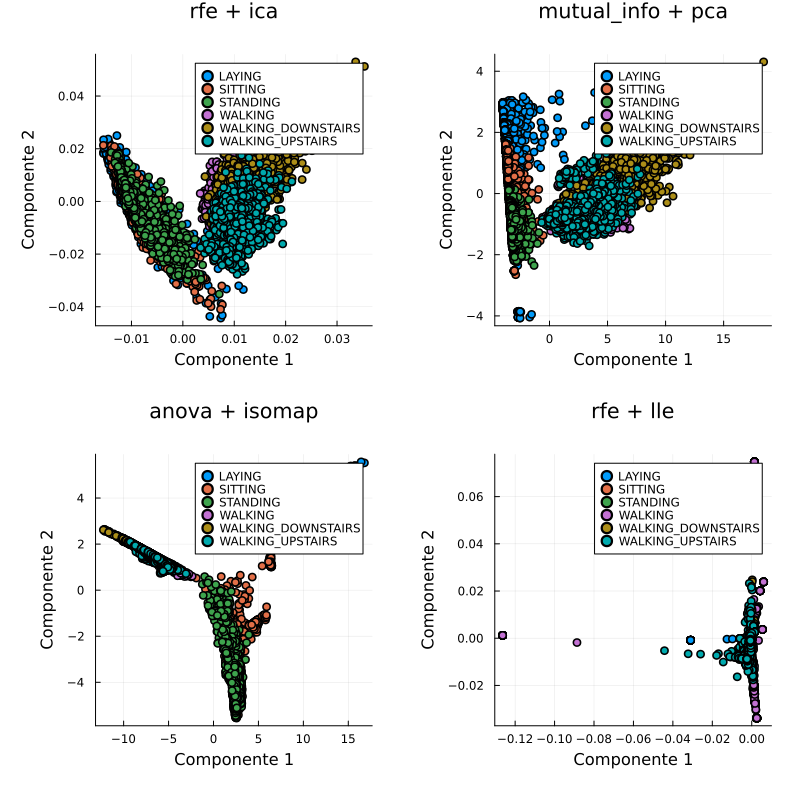

In [48]:
using Plots
import Plots.plot

# Visualizar datos proyectados en un subplot específico
function visualize_projection!(plt, X_proj::DataFrame, y, title::String, pos::Int)
    scatter!(plt[pos], X_proj[:, 1], X_proj[:, 2], 
            group=y, 
            legend=:topright, 
            xlabel="Componente 1", 
            ylabel="Componente 2", 
            title=title, 
            markersize=4)
end

# Aplicar PCA
function apply_pca(X::DataFrame, y, n_components::Int)
    X_matrix, _ = prepare_data_for_sklearn(X, y)
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_matrix)
    return DataFrame(X_pca, :auto)
end

# Aplicar LDA
function apply_lda(X::DataFrame, y, n_components::Int)
    X_matrix, y_numeric = prepare_data_for_sklearn(X, y)
    lda = LinearDiscriminantAnalysis(n_components=n_components)
    X_lda = lda.fit_transform(X_matrix, y_numeric)
    return DataFrame(X_lda, :auto)
end

# Aplicar ICA
function apply_ica(X::DataFrame, y, n_components::Int)
    X_matrix, _ = prepare_data_for_sklearn(X, y)
    ica = FastICA(n_components=n_components, random_state=42)
    X_ica = ica.fit_transform(X_matrix)
    return DataFrame(X_ica, :auto)
end

# Aplicar Isomap
function apply_isomap(X::DataFrame, y, n_components::Int)
    X_matrix, _ = prepare_data_for_sklearn(X, y)
    isomap = Isomap(n_components=n_components)
    X_isomap = isomap.fit_transform(X_matrix)
    return DataFrame(X_isomap, :auto)
end

# Aplicar LLE
function apply_lle(X::DataFrame, y, n_components::Int)
    X_matrix, _ = prepare_data_for_sklearn(X, y)
    lle = LocallyLinearEmbedding(n_components=n_components, random_state=42)
    X_lle = lle.fit_transform(X_matrix)
    return DataFrame(X_lle, :auto)
end
function apply_advanced_reduction(X::DataFrame, y, method::Symbol, n_components::Int=2)
    if method == :pca
        return apply_pca(X, y, n_components)
    elseif method == :lda
        return apply_lda(X, y, n_components)
    elseif method == :ica
        return apply_ica(X, y, n_components)
    elseif method == :isomap
        return apply_isomap(X, y, n_components)
    elseif method == :lle
        return apply_lle(X, y, n_components)
    else
        error("Técnica desconocida: $method")
    end
end
# Función principal para aplicar combinaciones (almacenar resultados)
function apply_combinations(train_data::DataFrame, filter_method::Symbol, 
                            reduction_method::Symbol, k::Union{Int, Nothing}=nothing, 
                            n_components::Int=2)
    feature_cols = setdiff(names(train_data), ["subject", "Activity"])
    X = train_data[:, feature_cols]
    y = train_data.Activity

    # Aplicar filtrado
    println("\n=== Aplicando filtrado: $filter_method ===")
    if filter_method == :anova
        X_filtered = apply_anova_filter(X, y, k)
    elseif filter_method == :mutual_info
        X_filtered = apply_mutual_info(X, y, k)
    elseif filter_method == :rfe
        X_filtered = apply_rfe(X, y)
    else
        error("Método de filtrado desconocido: $filter_method")
    end

    println("Características seleccionadas tras $filter_method: $(names(X_filtered))")

    # Aplicar reducción avanzada
    println("\n=== Aplicando reducción: $reduction_method ===")
    X_reduced = apply_advanced_reduction(X_filtered, y, reduction_method, n_components)
    return (X_reduced, y, "$filter_method + $reduction_method")
end

# Visualizar combinaciones aplicadas (usando resultados guardados)
function visualize_combinations(plt, combinations::Vector, pos::Vector)
    for (i, (X_proj, y, title)) in enumerate(combinations)
        visualize_projection!(plt, X_proj, y, title, pos[i])
    end
end

a = apply_combinations(train_data, :rfe, :ica)
b = apply_combinations(train_data, :mutual_info, :pca, 20)
c = apply_combinations(train_data, :anova, :isomap, 15)
d = apply_combinations(train_data, :rfe, :lle, nothing, 3)

# Ejecutar programa principal
function main(train_data::DataFrame)
    # Crear un layout de 2x2 para los subplots
    plt = plot(layout=(2, 2), size=(800, 800))
    # Aplicar y almacenar los resultados
    combination_results = [
        a,
        b,
        c,
        d   
    ]

    # Visualizar los resultados almacenados
    visualize_combinations(plt, combination_results, [1, 2, 3, 4])

    # Ajustar el espaciado entre subplots
    plot!(plt, margin=5Plots.mm)

    # Mostrar la figura completa
    display(plt)
end

# Llamada al programa principal (requiere un DataFrame `train_data`):
main(train_data)


In [49]:
using Flux  # Para MLP
using ScikitLearn: @sk_import  # Para KNN y SVM
using Statistics  # Para métricas básicas
using PyCall  # Para importar numpy
np = pyimport("numpy")

# Importar clasificadores de ScikitLearn
KNeighborsClassifier = @sk_import neighbors: KNeighborsClassifier
SVC = @sk_import svm: SVC

# Entrenar y evaluar un MLP
function train_mlp(X_train, y_train, X_test, y_test, architecture::Vector{Int})
    # Definir el tamaño de entrada y salida
    input_size = size(X_train, 2)
    output_size = length(unique(y_train))

    # Crear las capas ocultas
    hidden_layers = [Dense(input_size, architecture[1], relu)]
    for i in 2:length(architecture)
        push!(hidden_layers, Dense(architecture[i-1], architecture[i], relu))
    end

    # Agregar la capa de salida sin softmax
    output_layer = Dense(architecture[end], output_size)

    # Crear el modelo como una cadena de capas
    model = Chain(vcat(hidden_layers..., [output_layer])...)

    # Definir la función de pérdida (incluyendo softmax fuera del modelo)
    loss(x, y) = Flux.crossentropy(softmax(model(x)), y)
    optimizer = Flux.ADAM()

    # Convertir datos a formato adecuado
    X_train = permutedims(Matrix(X_train))  # Transponer dimensiones
    X_test = permutedims(Matrix(X_test))    # Transponer dimensiones
    y_train_onehot = Flux.onehotbatch(y_train, unique(y_train))  # One-hot encoding

    # Entrenar el modelo
    for epoch in 1:20
        Flux.train!(loss, Flux.params(model), [(X_train, y_train_onehot)], optimizer)
    end

    # Evaluar el modelo
    y_pred = Flux.onecold(softmax(model(X_test)), unique(y_train))
    accuracy = mean(y_pred .== y_test)
    return accuracy
end

# Entrenar y evaluar un KNN
function train_knn(X_train, y_train, X_test, y_test, k::Int)
    knn = KNeighborsClassifier(n_neighbors=k)
    # Convertir DataFrame a Array
    X_train_array = Matrix(X_train)
    X_test_array = Matrix(X_test)
    
    # Convertir las etiquetas categóricas a numéricas
    unique_labels = unique(y_train)
    label_map = Dict(label => i for (i, label) in enumerate(unique_labels))
    y_train_numeric = [label_map[label] for label in y_train]
    y_test_numeric = [label_map[label] for label in y_test]
    
    knn.fit(X_train_array, y_train_numeric)
    y_pred = knn.predict(X_test_array)
    accuracy = mean(y_pred .== y_test_numeric)
    return accuracy
end

function train_svm(X_train, y_train, X_test, y_test, C::Float64)
    svm = SVC(C=C)
    # Convertir DataFrame a Array
    X_train_array = Matrix(X_train)
    X_test_array = Matrix(X_test)
    
    # Convertir las etiquetas categóricas a numéricas
    unique_labels = unique(y_train)
    label_map = Dict(label => i for (i, label) in enumerate(unique_labels))
    y_train_numeric = [label_map[label] for label in y_train]
    y_test_numeric = [label_map[label] for label in y_test]
    
    svm.fit(X_train_array, y_train_numeric)
    y_pred = svm.predict(X_test_array)
    accuracy = mean(y_pred .== y_test_numeric)
    return accuracy
end


# Evaluar clasificadores con los conjuntos reducidos
function evaluate_classifiers(combinations::Vector)
    for (i, (X, y, title)) in enumerate(combinations)
        println("\n=== Evaluando clasificadores para combinación: $title ===")
        
        # Dividir en conjuntos de entrenamiento y prueba (80/20)
        n_train = Int(round(0.8 * size(X, 1)))
        indices = shuffle(1:size(X, 1))
        train_indices, test_indices = indices[1:n_train], indices[n_train+1:end]
        X_train, X_test = X[train_indices, :], X[test_indices, :]
        y_train, y_test = y[train_indices], y[test_indices]

        # Evaluar MLP
        for arch in [[50], [100], [100, 50]]
            acc_mlp = train_mlp(X_train, y_train, X_test, y_test, arch)
            println("MLP $arch -> Accuracy: $acc_mlp")
        end

        # Evaluar KNN
        for k in [1, 10, 20]
            acc_knn = train_knn(X_train, y_train, X_test, y_test, k)
            println("KNN (k=$k) -> Accuracy: $acc_knn")
        end

        # Evaluar SVM
        for C in [0.1, 0.5, 1.0]
            acc_svm = train_svm(X_train, y_train, X_test, y_test, C)
            println("SVM (C=$C) -> Accuracy: $acc_svm")
        end
    end
end

# Ejecutar programa principal extendido
function main(train_data::DataFrame)
    # Aplicar y almacenar los resultados de reducción
    combination_results = [
        a,
        b,
        c,
        d
    ]

    # Evaluar clasificadores con los conjuntos reducidos
    evaluate_classifiers(combination_results)
end

# Llamada al programa principal (requiere un DataFrame `train_data`):
main(train_data)



=== Evaluando clasificadores para combinación: rfe + ica ===


MLP [50] -> Accuracy: 0.1975374732334047
MLP [100] -> Accuracy: 0.21252676659528907
MLP [100, 50] -> Accuracy: 0.17184154175588864
KNN (k=1) -> Accuracy: 0.5208779443254818
KNN (k=10) -> Accuracy: 0.5877944325481799
KNN (k=20) -> Accuracy: 0.5963597430406852
SVM (C=0.1) -> Accuracy: 0.576017130620985
SVM (C=0.5) -> Accuracy: 0.5765524625267666
SVM (C=1.0) -> Accuracy: 0.5958244111349036

=== Evaluando clasificadores para combinación: mutual_info + pca ===
MLP [50] -> Accuracy: 0.15631691648822268
MLP [100] -> Accuracy: 0.37740899357601715
MLP [100, 50] -> Accuracy: 0.5974304068522484
KNN (k=1) -> Accuracy: 0.7462526766595289
KNN (k=10) -> Accuracy: 0.7553533190578159
KNN (k=20) -> Accuracy: 0.7505353319057816
SVM (C=0.1) -> Accuracy: 0.7018201284796574
SVM (C=0.5) -> Accuracy: 0.7093147751605996
SVM (C=1.0) -> Accuracy: 0.7103854389721628

=== Evaluando clasificadores para combinación: anova + isomap ===
MLP [50] -> Accuracy: 0.3533190578158458
MLP [100] -> Accuracy: 0.5058886509635975

# EJER 10


In [50]:
feature_cols = setdiff(names(train_data), ["subject", "Activity"])
X = train_data[:, feature_cols]
y = train_data.Activity

# Aplicar Filtrado ANOVA
println("\n=== Aplicando Filtrado ANOVA ===")
k_anova = floor(Int, size(X, 2) * 0.5)  # Reducir al 50% de características
X_filtered = apply_anova_filter(X, y, k_anova)






=== Aplicando Filtrado ANOVA ===


Row,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,tBodyAcc-max()-Y,tBodyAcc-max()-Z,tBodyAcc-min()-X,tBodyAcc-min()-Y,tBodyAcc-min()-Z,tBodyAcc-sma(),tBodyAcc-energy()-X,tBodyAcc-energy()-Y,tBodyAcc-energy()-Z,tBodyAcc-iqr()-X,tBodyAcc-iqr()-Y,tBodyAcc-iqr()-Z,tBodyAcc-entropy()-X,tBodyAcc-entropy()-Y,tBodyAcc-entropy()-Z,"tBodyAcc-arCoeff()-X,1",tGravityAcc-mean()-X,tGravityAcc-mean()-Y,tGravityAcc-mean()-Z,tGravityAcc-max()-X,tGravityAcc-max()-Y,tGravityAcc-max()-Z,tGravityAcc-min()-X,tGravityAcc-min()-Y,tGravityAcc-min()-Z,tGravityAcc-energy()-X,tGravityAcc-energy()-Y,tGravityAcc-energy()-Z,tBodyAccJerk-std()-X,tBodyAccJerk-std()-Y,tBodyAccJerk-std()-Z,tBodyAccJerk-mad()-X,tBodyAccJerk-mad()-Y,tBodyAccJerk-mad()-Z,tBodyAccJerk-max()-X,tBodyAccJerk-max()-Y,tBodyAccJerk-max()-Z,tBodyAccJerk-min()-X,tBodyAccJerk-min()-Y,tBodyAccJerk-min()-Z,tBodyAccJerk-sma(),tBodyAccJerk-energy()-X,tBodyAccJerk-energy()-Y,tBodyAccJerk-iqr()-X,tBodyAccJerk-iqr()-Y,tBodyAccJerk-iqr()-Z,tBodyAccJerk-entropy()-X,tBodyAccJerk-entropy()-Y,tBodyAccJerk-entropy()-Z,"tBodyAccJerk-arCoeff()-X,1",tBodyGyro-std()-X,tBodyGyro-std()-Y,tBodyGyro-std()-Z,tBodyGyro-mad()-X,tBodyGyro-mad()-Y,tBodyGyro-mad()-Z,tBodyGyro-max()-X,tBodyGyro-max()-Y,tBodyGyro-max()-Z,tBodyGyro-min()-X,tBodyGyro-min()-Y,tBodyGyro-min()-Z,tBodyGyro-sma(),tBodyGyro-energy()-X,tBodyGyro-iqr()-X,tBodyGyro-iqr()-Y,tBodyGyro-iqr()-Z,"tBodyGyro-arCoeff()-Z,2",tBodyGyroJerk-std()-X,tBodyGyroJerk-std()-Y,tBodyGyroJerk-std()-Z,tBodyGyroJerk-mad()-X,tBodyGyroJerk-mad()-Y,tBodyGyroJerk-mad()-Z,tBodyGyroJerk-max()-X,tBodyGyroJerk-max()-Y,tBodyGyroJerk-max()-Z,tBodyGyroJerk-min()-X,tBodyGyroJerk-min()-Y,tBodyGyroJerk-min()-Z,tBodyGyroJerk-sma(),tBodyGyroJerk-energy()-X,tBodyGyroJerk-energy()-Z,tBodyGyroJerk-iqr()-X,tBodyGyroJerk-iqr()-Y,tBodyGyroJerk-iqr()-Z,tBodyGyroJerk-entropy()-X,tBodyGyroJerk-entropy()-Y,tBodyGyroJerk-entropy()-Z,"tBodyGyroJerk-arCoeff()-Z,1",tBodyAccMag-mean(),tBodyAccMag-std(),tBodyAccMag-mad(),⋯
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,⋯
1,-0.883222,-0.945385,-0.744595,-0.87471,-0.945054,-0.773199,-0.8688,-0.936687,-0.643881,0.918826,0.874467,0.744081,-0.896228,-0.706269,-0.771176,-0.679379,-0.849465,-0.932821,-0.813121,-0.664947,-1.26951,-1.20689,3.40648,0.570665,-0.382357,0.069477,0.555981,-0.411646,0.0847072,0.57918,-0.371466,-0.0679074,0.650813,-0.548923,-0.499671,-0.86544,-0.87873,-0.830348,-0.86483,-0.879168,-0.83306,-0.793468,-0.831413,-0.77858,0.858284,0.855302,0.818801,-0.882625,-0.696442,-0.709976,-0.853937,-0.869878,-0.820193,-1.12989,-1.11565,-1.25377,3.65167,-0.877388,-0.823712,-0.908572,-0.867145,-0.818485,-0.898722,-0.8015,-0.735704,-0.868871,0.856085,0.853643,0.881959,-0.906446,-0.68638,-0.841205,-0.803869,-0.862215,-2.96826,-0.85828,-0.757041,-0.834972,-0.855233,-0.769668,-0.839733,-0.834821,-0.698194,-0.815261,0.836595,0.708335,0.766184,-0.845393,-0.624044,-0.599531,-0.843882,-0.77679,-0.832188,-1.01759,-1.29923,-0.959118,2.78511,-0.880363,-0.836909,-0.841546,⋯
2,-0.879999,-0.934012,-0.93242,-0.875653,-0.928523,-0.938847,-0.876211,-0.916763,-0.885037,0.883232,0.885488,0.844796,-0.946705,-0.706303,-0.770467,-0.704569,-0.85966,-0.896816,-0

In [51]:
using ScikitLearn
@sk_import ensemble: BaggingClassifier
@sk_import neighbors: KNeighborsClassifier

# Función para preparar los datos para ANOVA y BaggingClassifier
function train_bagging_knn(X_filtered,y, n_estimators, n_neighbors=5)
    # Preparar los datos para sklearn
    X_matrix, y_numeric = prepare_data_for_sklearn(X_filtered, y)

    # Crear y entrenar BaggingClassifier con KNN
    println("\n=== Entrenando BaggingClassifier ===")
    base_estimator = KNeighborsClassifier(n_neighbors=n_neighbors)
    model = BaggingClassifier(base_estimator=base_estimator, n_estimators=n_estimators, random_state=172)
    model.fit(X_matrix, y_numeric)

    println("Modelo entrenado con éxito.")
    return model, X_matrix, y_numeric
end

# Entrenar y evaluar modelos con 10 y 50 estimadores
function evaluate_bagging_models(X_filtered,y, n_neighbors=5)
    for n_estimators in [10, 50]
        println("\n=== Evaluación para n_estimators = $n_estimators ===")
        model, X_matrix, y_numeric = train_bagging_knn(X_filtered,y, n_estimators, n_neighbors)
        # Evaluación del modelo
        accuracy = model.score(X_matrix, y_numeric)
        println("Accuracy en entrenamiento: $accuracy")
    end
end

# Llamar a la función con los datos de entrenamiento
evaluate_bagging_models(X_filtered,y)


=== Evaluación para n_estimators = 10 ===

=== Entrenando BaggingClassifier ===


Modelo entrenado con éxito.

C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



Accuracy en entrenamiento: 0.9836223506743738

=== Evaluación para n_estimators = 50 ===

=== Entrenando BaggingClassifier ===
Modelo entrenado con éxito.


C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Accuracy en entrenamiento: 0.9842646114322415


In [52]:
using ScikitLearn
@sk_import ensemble: AdaBoostClassifier
@sk_import svm: SVC

# Función para preparar los datos y entrenar AdaBoost con SVM y kernel lineal
function train_adaboost_svm(X_filtered, y, n_estimators)
    # Preparar los datos para sklearn
    X_matrix, y_numeric = prepare_data_for_sklearn(X_filtered, y)

    # Crear y entrenar AdaBoostClassifier con SVM
    println("\n=== Entrenando AdaBoostClassifier ===")
    base_estimator = SVC(kernel="linear", probability=true, random_state=172)
    model = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=n_estimators, random_state=172)
    fit!(model, X_matrix, y_numeric)

    println("Modelo entrenado con éxito.")
    return model, X_matrix, y_numeric
end

# Entrenar y evaluar el modelo con 5 estimadores
function evaluate_adaboost_model(X_filtered, y)
    println("\n=== Evaluación para AdaBoost con SVM ===")
    model, X_matrix, y_numeric = train_adaboost_svm(X_filtered, y, 5)
    # Evaluación del modelo
    accuracy = score(model, X_matrix, y_numeric)
    println("Accuracy en entrenamiento: $accuracy")
end

# Llamar a la función con los datos de entrenamiento
evaluate_adaboost_model(train_data)



=== Evaluación para AdaBoost con SVM ===

=== Entrenando AdaBoostClassifier ===


Modelo entrenado con éxito.


C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Accuracy en entrenamiento: 0.9022693213444658


In [53]:
using ScikitLearn
@sk_import ensemble: GradientBoostingClassifier

# Función para preparar los datos y entrenar GBM
function train_gbm(X_filtered,y, n_estimators, learning_rate)
    # Preparar los datos para sklearn
    X_matrix, y_numeric = prepare_data_for_sklearn(X_filtered, y)

    # Crear y entrenar Gradient Boosting Classifier
    println("\n=== Entrenando GradientBoostingClassifier ===")
    model = GradientBoostingClassifier(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        random_state=172
    )
    model.fit(X_matrix, y_numeric)

    println("Modelo entrenado con éxito.")
    return model, X_matrix, y_numeric
end

# Entrenar y evaluar el modelo
function evaluate_gbm_model(X_filtered,y)
    println("\n=== Evaluación para Gradient Boosting Classifier ===")
    model, X_matrix, y_numeric = train_gbm(X_filtered,y, 50, 0.2)
    # Evaluación del modelo
    accuracy = model.score(X_matrix, y_numeric)
    println("Accuracy en entrenamiento: $accuracy")
end

# Llamar a la función con los datos de entrenamiento
evaluate_gbm_model(X_filtered,y)


=== Evaluación para Gradient Boosting Classifier ===

=== Entrenando GradientBoostingClassifier ===


Modelo entrenado con éxito.
Accuracy en entrenamiento: 0.999464782701777


# Ejercicio 11

11.1

In [54]:
using Flux
using Statistics
using DataFrames
using ScikitLearn
using ScikitLearn: fit!, predict
using CategoricalArrays
using Random

@sk_import svm: (SVC,)
@sk_import neighbors: (KNeighborsClassifier,)
@sk_import ensemble: (BaggingClassifier, AdaBoostClassifier)
@sk_import tree: (DecisionTreeClassifier,)
@sk_import metrics: (accuracy_score, classification_report)
@sk_import preprocessing: (LabelEncoder,)

function evaluate_all_models(train_data::DataFrame)
    # Preparar los datos
    feature_cols = setdiff(names(train_data), ["subject", "Activity"])
    X = Matrix{Float64}(train_data[:, feature_cols])
    y = string.(train_data.Activity)  # Convertir a string

    # Convertir las etiquetas a valores numéricos
    le = LabelEncoder()
    y = fit_transform!(le, collect(y))

    # Dividir en train y test (80/20)
    n = size(X, 1)
    n_train = Int(round(0.8 * n))
    indices = shuffle(1:n)
    train_indices = indices[1:n_train]
    test_indices = indices[n_train+1:end]
    
    X_train = X[train_indices, :]
    y_train = y[train_indices]
    X_test = X[test_indices, :]
    y_test = y[test_indices]

    # Función auxiliar para evaluar y mostrar resultados
    function evaluate_and_print(name, y_pred)
        accuracy = mean(y_pred .== y_test)
        println("$name Accuracy: $accuracy")
        println(classification_report(y_test, y_pred))
    end

    # KNN
    println("\n=== Evaluando KNN ===")
    try
        knn = KNeighborsClassifier(n_neighbors=5)
        fit!(knn, X_train, y_train)
        y_pred_knn = predict(knn, X_test)
        evaluate_and_print("KNN", y_pred_knn)
    catch e
        println("Error en KNN: ", e)
    end

    # SVM
    println("\n=== Evaluando SVM ===")
    try
        svm = SVC(C=1.0, kernel="rbf", probability=true)
        fit!(svm, X_train, y_train)
        y_pred_svm = predict(svm, X_test)
        evaluate_and_print("SVM", y_pred_svm)
    catch e
        println("Error en SVM: ", e)
    end

    # MLP
    println("\n=== Evaluando MLP ===")
    try
        input_size = size(X_train, 2)
        output_size = length(unique(y_train))
        model = Chain(
            Dense(input_size, 100, relu),
            Dense(100, 50, relu),
            Dense(50, output_size)
        )
        loss(x, y) = Flux.crossentropy(softmax(model(x')), Flux.onehotbatch(y, unique(y_train)))
        optimizer = ADAM()
        dataset = Flux.Data.DataLoader((X_train', y_train), batchsize=32, shuffle=true)
        for epoch in 1:50
            Flux.train!(loss, Flux.params(model), dataset, optimizer)
        end
        y_pred_mlp = Flux.onecold(model(X_test'), unique(y_train))
        evaluate_and_print("MLP", y_pred_mlp)
    catch e
        println("Error en MLP: ", e)
    end

    # Bagging
    println("\n=== Evaluando Bagging ===")
    try
        base_estimator = DecisionTreeClassifier()
        bagging = BaggingClassifier(base_estimator=base_estimator, n_estimators=10, random_state=172)
        fit!(bagging, X_train, y_train)
        y_pred_bagging = predict(bagging, X_test)
        evaluate_and_print("Bagging", y_pred_bagging)
    catch e
        println("Error en Bagging: ", e)
    end

    # AdaBoost
    println("\n=== Evaluando AdaBoost ===")
    try
        base_estimator = DecisionTreeClassifier(max_depth=1)
        adaboost = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=50, random_state=172)
        fit!(adaboost, X_train, y_train)
        y_pred_adaboost = predict(adaboost, X_test)
        evaluate_and_print("AdaBoost", y_pred_adaboost)
    catch e
        println("Error en AdaBoost: ", e)
    end

end


evaluate_all_models(train_data)


=== Evaluando KNN ===


KNN Accuracy: 0.9646680942184154
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       368
           1       0.91      0.90      0.91       314
           2       0.91      0.92      0.92       342
           3       0.99      0.99      0.99       305
           4       1.00      0.99      0.99       270
           5       0.99      0.99      0.99       269

    accuracy                           0.96      1868
   macro avg       0.97      0.97      0.97      1868
weighted avg       0.96      0.96      0.96      1868


=== Evaluando SVM ===
SVM Accuracy: 0.974304068522484
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       368
           1       0.94      0.92      0.93       314
           2       0.93      0.95      0.94       342
           3       1.00      0.99      1.00       305
           4       0.98      1.00      0.99       270
           5       1.00      0.99      1.00 

C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


AdaBoost Accuracy: 0.5422912205567452
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       368
           1       0.00      0.00      0.00       314
           2       0.52      1.00      0.69       342
           3       0.36      1.00      0.53       305
           4       0.00      0.00      0.00       270
           5       0.00      0.00      0.00       269

    accuracy                           0.54      1868
   macro avg       0.31      0.50      0.37      1868
weighted avg       0.35      0.54      0.41      1868



C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score

11.2

In [55]:
using Flux
using Statistics
using DataFrames
using ScikitLearn
using ScikitLearn: fit!, predict
using CategoricalArrays
using Random

@sk_import svm: (SVC,)
@sk_import neighbors: (KNeighborsClassifier,)
@sk_import ensemble: (BaggingClassifier, AdaBoostClassifier, RandomForestClassifier)
@sk_import tree: (DecisionTreeClassifier,)
@sk_import metrics: (accuracy_score, classification_report)
@sk_import preprocessing: (LabelEncoder,)

function evaluate_all_models(train_data::DataFrame)
    # Preparar los datos
    feature_cols = setdiff(names(train_data), ["subject", "Activity"])
    X = Matrix{Float64}(train_data[:, feature_cols])
    y = string.(train_data.Activity)  # Convertir a string

    # Convertir las etiquetas a valores numéricos
    le = LabelEncoder()
    y = fit_transform!(le, collect(y))

    # Dividir en train y test (80/20)
    n = size(X, 1)
    n_train = Int(round(0.8 * n))
    indices = shuffle(1:n)
    train_indices = indices[1:n_train]
    test_indices = indices[n_train+1:end]
    
    X_train = X[train_indices, :]
    y_train = y[train_indices]
    X_test = X[test_indices, :]
    y_test = y[test_indices]

    # Función auxiliar para evaluar y mostrar resultados
    function evaluate_and_print(name, y_pred)
        accuracy = mean(y_pred .== y_test)
        println("$name Accuracy: $accuracy")
        println(classification_report(y_test, y_pred))
    end

    # KNN
    println("\n=== Evaluando KNN ===")
    try
        knn = KNeighborsClassifier(n_neighbors=5)
        fit!(knn, X_train, y_train)
        y_pred_knn = predict(knn, X_test)
        evaluate_and_print("KNN", y_pred_knn)
    catch e
        println("Error en KNN: ", e)
    end

    # SVM
    println("\n=== Evaluando SVM ===")
    try
        svm = SVC(C=1.0, kernel="rbf", probability=true)
        fit!(svm, X_train, y_train)
        y_pred_svm = predict(svm, X_test)
        evaluate_and_print("SVM", y_pred_svm)
    catch e
        println("Error en SVM: ", e)
    end

    # MLP
    println("\n=== Evaluando MLP ===")
    try
        input_size = size(X_train, 2)
        output_size = length(unique(y_train))
        model = Chain(
            Dense(input_size, 100, relu),
            Dense(100, 50, relu),
            Dense(50, output_size)
        )
        loss(x, y) = Flux.crossentropy(softmax(model(x')), Flux.onehotbatch(y, unique(y_train)))
        optimizer = ADAM()
        dataset = Flux.Data.DataLoader((X_train', y_train), batchsize=32, shuffle=true)
        for epoch in 1:50
            Flux.train!(loss, Flux.params(model), dataset, optimizer)
        end
        y_pred_mlp = Flux.onecold(model(X_test'), unique(y_train))
        evaluate_and_print("MLP", y_pred_mlp)
    catch e
        println("Error en MLP: ", e)
    end

    # Bagging
    println("\n=== Evaluando Bagging ===")
    try
        base_estimator = DecisionTreeClassifier()
        bagging = BaggingClassifier(base_estimator=base_estimator, n_estimators=10, random_state=172)
        fit!(bagging, X_train, y_train)
        y_pred_bagging = predict(bagging, X_test)
        evaluate_and_print("Bagging", y_pred_bagging)
    catch e
        println("Error en Bagging: ", e)
    end

    # AdaBoost
    println("\n=== Evaluando AdaBoost ===")
    try
        base_estimator = DecisionTreeClassifier(max_depth=1)
        adaboost = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=50, random_state=172)
        fit!(adaboost, X_train, y_train)
        y_pred_adaboost = predict(adaboost, X_test)
        evaluate_and_print("AdaBoost", y_pred_adaboost)
    catch e
        println("Error en AdaBoost: ", e)
    end

    # Random Forest
    println("\n=== Evaluando Random Forest ===")
    try
        rf = RandomForestClassifier(n_estimators=500, max_depth=10, random_state=172)
        # Comprobar los parámetros del modelo
        println("Número de estimadores: ", rf.n_estimators)
        println("Profundidad máxima: ", rf.max_depth)

        fit!(rf, X_train, y_train)
        y_pred_rf = predict(rf, X_test)
        evaluate_and_print("Random Forest", y_pred_rf)
    catch e
        println("Error en Random Forest: ", e)
    end
end

evaluate_all_models(train_data)



=== Evaluando KNN ===
KNN Accuracy: 0.9662740899357601
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       380
           1       0.93      0.90      0.91       318
           2       0.91      0.95      0.93       351
           3       0.98      1.00      0.99       290
           4       1.00      0.98      0.99       253
           5       0.99      0.99      0.99       276

    accuracy                           0.97      1868
   macro avg       0.97      0.97      0.97      1868
weighted avg       0.97      0.97      0.97      1868


=== Evaluando SVM ===
SVM Accuracy: 0.9732334047109208
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       380
           1       0.93      0.92      0.92       318
           2       0.93      0.94      0.93       351
           3       1.00      1.00      1.00       290
           4       0.99      1.00      1.00       253
           5       1

C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



AdaBoost Accuracy: 0.5465738758029979
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       380
           1       0.00      0.00      0.00       318
           2       0.52      1.00      0.69       351
           3       0.35      1.00      0.52       290
           4       0.00      0.00      0.00       253
           5       0.00      0.00      0.00       276

    accuracy                           0.55      1868
   macro avg       0.31      0.50      0.37      1868
weighted avg       0.36      0.55      0.41      1868


=== Evaluando Random Forest ===
Número de estimadores: 500
Profundidad máxima: 10


C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\leonf\.julia\conda\3\x86_64\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score

Random Forest Accuracy: 0.9694860813704497
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       380
           1       0.94      0.92      0.93       318
           2       0.93      0.94      0.94       351
           3       1.00      0.99      0.99       290
           4       0.98      0.98      0.98       253
           5       0.98      0.98      0.98       276

    accuracy                           0.97      1868
   macro avg       0.97      0.97      0.97      1868
weighted avg       0.97      0.97      0.97      1868



11.3


In [70]:


using ScikitLearn: fit!, predict, transform
@sk_import ensemble: RandomForestClassifier

function train_random_forest(train_data::DataFrame, test_data::DataFrame, class_column::Symbol, id_column::Symbol)
    # Preparar los datos
    feature_cols = setdiff(names(train_data), [string(id_column), string(class_column)])
    numeric_cols = filter(col -> eltype(train_data[!, col]) <: Number, feature_cols)
    
    X_train = Matrix{Float64}(train_data[:, numeric_cols])
    X_test = Matrix{Float64}(test_data[:, numeric_cols])
    
    # Convertir CategoricalArray a Array de strings
    y_train = string.(train_data[:, class_column])
    y_test = string.(test_data[:, class_column])
    
    # Codificar las etiquetas
    le = LabelEncoder()
    y_train_encoded = fit_transform!(le, y_train)
    y_test_encoded = transform(le, y_test)

    # Crear y entrenar el modelo de Random Forest
    rf_model = RandomForestClassifier(n_estimators=500, max_depth=10, random_state=42)
    fit!(rf_model, X_train, y_train_encoded)

    # Hacer predicciones
    y_train_pred = predict(rf_model, X_train)
    y_test_pred = predict(rf_model, X_test)

    # Calcular la precisión
    train_accuracy = mean(y_train_pred .== y_train_encoded)
    test_accuracy = mean(y_test_pred .== y_test_encoded)

    println("Random Forest - Accuracy in training: $(round(train_accuracy, digits=4))")
    println("Random Forest - Accuracy in test (10% held out): $(round(test_accuracy, digits=4))")

    return rf_model, le, numeric_cols
end
# Llama a la función con los datos
rf_model, rf_label_encoder,rf_features = train_random_forest(train_data, holdout_data, :Activity, :subject)


Random Forest - Accuracy in training: 0.9934
Random Forest - Accuracy in test (10% held out): 0.9582


(PyObject RandomForestClassifier(max_depth=10, n_estimators=500, random_state=42), PyObject LabelEncoder(), ["tBodyAcc-mean()-X", "tBodyAcc-mean()-Y", "tBodyAcc-mean()-Z", "tBodyAcc-std()-X", "tBodyAcc-std()-Y", "tBodyAcc-std()-Z", "tBodyAcc-mad()-X", "tBodyAcc-mad()-Y", "tBodyAcc-mad()-Z", "tBodyAcc-max()-X"  …  "fBodyBodyGyroJerkMag-meanFreq()", "fBodyBodyGyroJerkMag-skewness()", "fBodyBodyGyroJerkMag-kurtosis()", "angle(tBodyAccMean,gravity)", "angle(tBodyAccJerkMean),gravityMean)", "angle(tBodyGyroMean,gravityMean)", "angle(tBodyGyroJerkMean,gravityMean)", "angle(X,gravityMean)", "angle(Y,gravityMean)", "angle(Z,gravityMean)"])

11.3

In [56]:
using ScikitLearn
using DataFrames
using CategoricalArrays
using Statistics

@sk_import ensemble: VotingClassifier
@sk_import neighbors: KNeighborsClassifier
@sk_import svm: SVC
@sk_import neural_network: MLPClassifier
@sk_import preprocessing: LabelEncoder
@sk_import metrics: accuracy_score

function hard_voting_classifier(train_data::DataFrame, test_data::DataFrame, class_column::Symbol, id_column::Symbol)
    # Identificar columnas categóricas
    categorical_cols = names(train_data)[eltype.(eachcol(train_data)) .<: CategoricalValue]
    
    # Convertir columnas categóricas a numéricas
    for col in categorical_cols
        train_data[!, col] = levelcode.(train_data[!, col])
        test_data[!, col] = levelcode.(test_data[!, col])
    end
    
    # Preparar datos
    feature_cols = setdiff(names(train_data), [id_column, class_column])
    X_train = Matrix{Float64}(train_data[:, feature_cols])
    X_test = Matrix{Float64}(test_data[:, feature_cols])
    
    # Codificar las etiquetas
    le = LabelEncoder()
    y_train = fit_transform!(le, train_data[:, class_column])
    y_test = fit_transform!(le, test_data[:, class_column])

    # Modelos individuales (mejores combinaciones)
    knn = KNeighborsClassifier(n_neighbors=5)
    svm = SVC(C=0.5, kernel="linear", probability=true, random_state=172)
    mlp = MLPClassifier(hidden_layer_sizes=(100,), random_state=172, max_iter=500)

    # Hard Voting Classifier
    voting_clf = VotingClassifier(
        estimators=[("knn", knn), ("svm", svm), ("mlp", mlp)],
        voting="hard"
    )

    # Entrenar el clasificador
    println("\n=== Entrenando Hard Voting Classifier ===")
    fit!(voting_clf, X_train, y_train)

    # Hacer predicciones
    y_train_pred = predict(voting_clf, X_train)
    y_test_pred = predict(voting_clf, X_test)

    # Calcular accuracy
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)

    println("Accuracy en entrenamiento: $(round(train_accuracy, digits=4))")
    println("Accuracy en prueba (10% reservado): $(round(test_accuracy, digits=4))")

    # Calcular y mostrar predicciones por modelo individual
    println("\n=== Evaluación de modelos individuales ===")
    for (name, model) in [("KNN", knn), ("SVM", svm), ("MLP", mlp)]
        fit!(model, X_train, y_train)
        train_pred = predict(model, X_train)
        test_pred = predict(model, X_test)
        
        train_acc = accuracy_score(y_train, train_pred)
        test_acc = accuracy_score(y_test, test_pred)
        
        println("$name - Train Accuracy: $(round(train_acc, digits=4)), Test Accuracy: $(round(test_acc, digits=4))")
    end

    return voting_clf, le
end

# Ejemplo de uso:
voting_clf, label_encoder = hard_voting_classifier(train_data, holdout_data, :Activity, :subject)


=== Entrenando Hard Voting Classifier ===


Accuracy en entrenamiento: 1.0
Accuracy en prueba (10% reservado): 0.9979

=== Evaluación de modelos individuales ===
KNN - Train Accuracy: 0.9862, Test Accuracy: 0.9415
SVM - Train Accuracy: 1.0, Test Accuracy: 0.9979
MLP - Train Accuracy: 1.0, Test Accuracy: 0.9958


(PyObject VotingClassifier(estimators=[('knn', KNeighborsClassifier()),
                             ('svm',
                              SVC(C=0.5, kernel='linear', probability=True,
                                  random_state=172)),
                             ('mlp',
                              MLPClassifier(max_iter=500, random_state=172))]), PyObject LabelEncoder())

11.4

In [57]:
using Flux
using Statistics
using DataFrames
using ScikitLearn
using ScikitLearn: fit!, predict, predict_proba
using Random

@sk_import svm: (SVC,)
@sk_import neighbors: (KNeighborsClassifier,)
@sk_import neural_network: (MLPClassifier,)
@sk_import ensemble: (VotingClassifier,)
@sk_import model_selection: (cross_val_score,)
@sk_import preprocessing: (LabelEncoder, StandardScaler)

function create_soft_voting_classifier(train_data::DataFrame)
    # Preparar los datos
    feature_cols = setdiff(names(train_data), ["subject", "Activity"])
    X = Matrix{Float64}(train_data[:, feature_cols])
    y = string.(train_data.Activity)

    # Convertir las etiquetas a valores numéricos
    le = LabelEncoder()
    y = fit_transform!(le, collect(y))

    # Escalar las características
    scaler = StandardScaler()
    X = fit_transform!(scaler, X)

    # Definir los modelos
    knn = KNeighborsClassifier(n_neighbors=5)
    svm = SVC(C=1.0, kernel="rbf", probability=true)
    mlp = MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500)

    # Lista para almacenar los modelos y sus puntuaciones
    models = [("KNN", knn), ("SVM", svm), ("MLP", mlp)]
    scores = []

    # Realizar 5-fold cross-validation para cada modelo
    for (name, model) in models
        cv_scores = cross_val_score(model, X, y, cv=5)
        mean_score = mean(cv_scores)
        push!(scores, mean_score)
        println("$name - Puntuación media en 5-fold CV: $mean_score")
    end

    # Normalizar las puntuaciones para usarlas como pesos
    total_score = sum(scores)
    weights = scores ./ total_score

    # Crear el Soft Voting Classifier
    soft_voting = VotingClassifier(
        estimators=models,
        voting="soft",
        weights=weights
    )

    # Entrenar el Soft Voting Classifier
    fit!(soft_voting, X, y)

    # Evaluar el Soft Voting Classifier
    voting_score = mean(cross_val_score(soft_voting, X, y, cv=5))
    println("\nSoft Voting Classifier - Puntuación media en 5-fold CV: $voting_score")

    return soft_voting, le, scaler
end

# Usar la función
soft_voting, label_encoder, scaler = create_soft_voting_classifier(train_data)


┌ Warning: Module model_selection has been ported to Julia - try `import ScikitLearn: CrossValidation` instead
└ @ ScikitLearn.Skcore C:\Users\leonf\.julia\packages\ScikitLearn\sqLdT\src\Skcore.jl:259


KNN - Puntuación media en 5-fold CV: 0.8773308563133648


SVM - Puntuación media en 5-fold CV: 0.9369515354201253
MLP - Puntuación media en 5-fold CV: 0.9441253266698976

Soft Voting Classifier - Puntuación media en 5-fold CV: 0.9420902634325632


(PyObject VotingClassifier(estimators=[('KNN', KNeighborsClassifier()),
                             ('SVM', SVC(probability=True)),
                             ('MLP',
                              MLPClassifier(hidden_layer_sizes=(100, 50),
                                            max_iter=500))],
                 voting='soft',
                 weights=array([0.31805699, 0.33967115, 0.34227186])), PyObject LabelEncoder(), PyObject StandardScaler())

In [71]:
using ScikitLearn: fit!, predict, transform

function train_xgboost(train_data::DataFrame, test_data::DataFrame, class_column::Symbol, id_column::Symbol)
    # Preparar los datos
    feature_cols = setdiff(names(train_data), [string(id_column), string(class_column)])
    numeric_cols = filter(col -> eltype(train_data[!, col]) <: Number, feature_cols)
    
    X_train = Matrix{Float64}(train_data[:, numeric_cols])
    X_test = Matrix{Float64}(test_data[:, numeric_cols])
    
    # Convertir CategoricalArray a Array de strings
    y_train = string.(train_data[:, class_column])
    y_test = string.(test_data[:, class_column])
    
    # Codificar las etiquetas
    le = LabelEncoder()
    y_train_encoded = fit_transform!(le, y_train)
    y_test_encoded = transform(le, y_test)

    xgb_model = xgboost((X_train, y_train_encoded), num_round=10)

    # Make predictions using XGBoost's native method
    y_train_pred = XGBoost.predict(xgb_model, X_train)
    y_test_pred = XGBoost.predict(xgb_model, X_test)

    # Calculate accuracy
    train_accuracy = mean(round.(y_train_pred) .== y_train_encoded)
    test_accuracy = mean(round.(y_test_pred) .== y_test_encoded)

    println("XGBoost - Accuracy in training: $(round(train_accuracy, digits=4))")
    println("XGBoost - Accuracy in test (10% held out): $(round(test_accuracy, digits=4))")

    return xgb_model, le, numeric_cols
end

xgb_model, xgb_label_encoder, xgb_features = train_xgboost(train_data, holdout_data, :Activity, :subject)

[ Info: XGBoost: starting training.
[ Info: [1]	train-rmse:1.20128425928381910
[ Info: [2]	train-rmse:0.85861726459911747
[ Info: [3]	train-rmse:0.62143324577750680
[ Info: [4]	train-rmse:0.45791725120754184
[ Info: [5]	train-rmse:0.34658053292625085
[ Info: [6]	train-rmse:0.27125353690203041
[ Info: [7]	train-rmse:0.22042208134795954
[ Info: [8]	train-rmse:0.18662710462495782
[ Info: [9]	train-rmse:0.16568519246652144
[ Info: [10]	train-rmse:0.15168918715637261
[ Info: Training rounds complete.


XGBoost - Accuracy in training: 0.9794
XGBoost - Accuracy in test (10% held out): 0.9373


(Booster(), PyObject LabelEncoder(), ["tBodyAcc-mean()-X", "tBodyAcc-mean()-Y", "tBodyAcc-mean()-Z", "tBodyAcc-std()-X", "tBodyAcc-std()-Y", "tBodyAcc-std()-Z", "tBodyAcc-mad()-X", "tBodyAcc-mad()-Y", "tBodyAcc-mad()-Z", "tBodyAcc-max()-X"  …  "fBodyBodyGyroJerkMag-meanFreq()", "fBodyBodyGyroJerkMag-skewness()", "fBodyBodyGyroJerkMag-kurtosis()", "angle(tBodyAccMean,gravity)", "angle(tBodyAccJerkMean),gravityMean)", "angle(tBodyGyroMean,gravityMean)", "angle(tBodyGyroJerkMean,gravityMean)", "angle(X,gravityMean)", "angle(Y,gravityMean)", "angle(Z,gravityMean)"])

12


In [ ]:
function print_feature_importance(rf_model, xgb_model, feature_names)

    println("\n=== XGBoost Feature Importances ===")
    xgb_importances = XGBoost.importance(xgb_model)
    importance_values = collect(values(xgb_importances))
    xgb_importance_sorted = sort(collect(zip(feature_names, importance_values)), by=x->x[2], rev=true)
    for (feature, importance) in xgb_importance_sorted
        println("$feature: $(round.(importance, digits=4))")
    end

end
# Luego, llamar a la función de impresión de importancia
print_feature_importance(rf_model, xgb_model, rf_features)



=== XGBoost Feature Importances ===
tBodyAcc-mean()-X: Float32[7137.2886]
tBodyAcc-mean()-Y: Float32[2408.22]
tBodyAcc-mean()-Z: Float32[1184.3306]
tBodyAcc-std()-X: Float32[295.1136]
tBodyAcc-std()-Y: Float32[287.1663]
tBodyAcc-std()-Z: Float32[264.5065]
tBodyAcc-mad()-X: Float32[142.8863]
tBodyAcc-mad()-Y: Float32[80.4497]
tBodyAcc-mad()-Z: Float32[69.983]
tBodyAcc-max()-X: Float32[62.7753]
tBodyAcc-max()-Y: Float32[52.6037]
tBodyAcc-max()-Z: Float32[47.6431]
tBodyAcc-min()-X: Float32[43.5332]
tBodyAcc-min()-Y: Float32[42.5147]
tBodyAcc-min()-Z: Float32[37.1484]
tBodyAcc-sma(): Float32[31.7346]
tBodyAcc-energy()-X: Float32[31.6871]
tBodyAcc-energy()-Y: Float32[31.6056]
tBodyAcc-energy()-Z: Float32[30.3423]
tBodyAcc-iqr()-X: Float32[28.4207]
tBodyAcc-iqr()-Y: Float32[24.4159]
tBodyAcc-iqr()-Z: Float32[23.0695]
tBodyAcc-entropy()-X: Float32[17.4874]
tBodyAcc-entropy()-Y: Float32[15.6019]
tBodyAcc-entropy()-Z: Float32[14.8604]
tBodyAcc-arCoeff()-X,1: Float32[11.1024]
tBodyAcc-arCoeff()

In [79]:
function print_feature_importance(rf_model, xgb_model, feature_names)
    println("\n=== Random Forest Feature Importances ===")
    rf_importances = rf_model.feature_importances_
    rf_importance_sorted = sort(collect(zip(feature_names, rf_importances)), by=x->x[2], rev=true)
    for (feature, importance) in rf_importance_sorted
        println("$feature: $(round(importance, digits=4))")
    end

end
# Luego, llamar a la función de impresión de importancia
print_feature_importance(rf_model, xgb_model, rf_features)



=== Random Forest Feature Importances ===
tGravityAcc-min()-X: 0.0341
angle(X,gravityMean): 0.033
tGravityAcc-mean()-X: 0.032
tGravityAcc-energy()-X: 0.0269
tGravityAcc-mean()-Y: 0.0258
tGravityAcc-max()-X: 0.0255
tGravityAcc-max()-Y: 0.0222
tGravityAcc-min()-Y: 0.0211
angle(Y,gravityMean): 0.0209
tGravityAcc-energy()-Y: 0.0132
fBodyAccJerk-bandsEnergy()-1,8: 0.0112
fBodyAccJerk-bandsEnergy()-1,16: 0.0104
tGravityAcc-min()-Z: 0.0103
tBodyAccJerk-std()-X: 0.0097
tGravityAcc-arCoeff()-Y,1: 0.0095
angle(Z,gravityMean): 0.0094
fBodyAccMag-std(): 0.0091
fBodyAccMag-energy(): 0.0091
fBodyAccJerk-energy()-X: 0.0089
fBodyAccJerk-bandsEnergy()-1,24: 0.0088
tGravityAccMag-std(): 0.0087
tGravityAcc-arCoeff()-X,1: 0.0085
tGravityAcc-energy()-Z: 0.0084
tBodyAccMag-std(): 0.0083
tGravityAcc-mean()-Z: 0.0083
tGravityAcc-max()-Z: 0.0082
fBodyAccMag-mad(): 0.0081
tGravityAcc-arCoeff()-Z,1: 0.0078
tBodyAcc-max()-X: 0.0076
tGravityAcc-arCoeff()-Y,2: 0.0076
tGravityAcc-entropy()-Y: 0.0076
fBodyAccJerk-me